In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import calendar

from datetime import datetime

import plotly.offline as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)
from plotly import tools

import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")

In [ ]:
data = pd.read_csv('avocado.csv')
original_data = data.copy()

## **EXPLORATORY DATA ANALYSIS**

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18249 entries, 0 to 18248
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Unnamed: 0    18249 non-null  int64  
 1   Date          18249 non-null  object 
 2   AveragePrice  18249 non-null  float64
 3   Total Volume  18249 non-null  float64
 4   4046          18249 non-null  float64
 5   4225          18249 non-null  float64
 6   4770          18249 non-null  float64
 7   Total Bags    18249 non-null  float64
 8   Small Bags    18249 non-null  float64
 9   Large Bags    18249 non-null  float64
 10  XLarge Bags   18249 non-null  float64
 11  type          18249 non-null  object 
 12  year          18249 non-null  int64  
 13  region        18249 non-null  object 
dtypes: float64(9), int64(2), object(3)
memory usage: 1.9+ MB


In [ ]:
print("Shape of data",data.shape)

Shape of data (18249, 14)


In [ ]:
data.columns

Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')

We will split the date column into year, month and day for further analysis.

In [ ]:
data['year']=data['Date'].apply(lambda x : x.split("-")[0])
data['month']=data['Date'].apply(lambda x : calendar.month_name[datetime.strptime(x,"%Y-%m-%d").month])
data['day']=data['Date'].apply(lambda x : calendar.day_name[datetime.strptime(x,"%Y-%m-%d").weekday()])

In [ ]:
data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month,day
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,December,Sunday
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,December,Sunday
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,December,Sunday
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,December,Sunday
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,November,Sunday


In [ ]:
data = data.drop('Unnamed: 0',axis = 1)

In this phase, we will concentrate mainly on two aspects of the time series forecasting analysis, consists of:

Seasonal Patterns: In this section, we
will focus on constant patterns that occur frequently from year to year and from month to month in both conventional and organic avocados.

Cyclical Patterns: This section will require me to search deeper into what factors could have affected the price of avocados during those years (low supply, storms etc.) and will be fascinating to see if any of those factors contributed to any significant price changes.

In [ ]:
unique_types = data['type'].unique()
print(unique_types)

['conventional' 'organic']


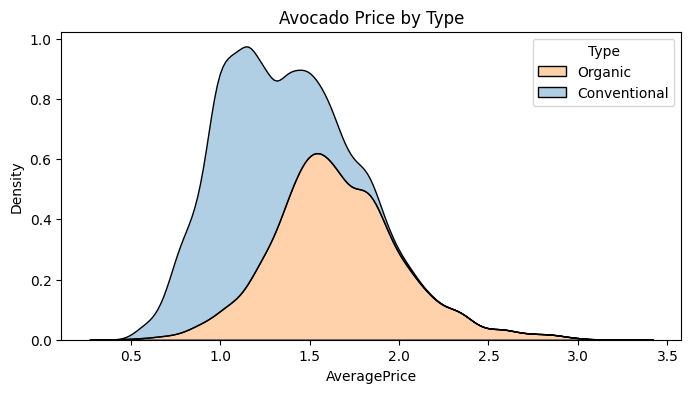

In [ ]:
# Density plots of the different type of avocadoes
filtered_data = data[data['type'].isin(['organic', 'conventional'])]
plt.figure(figsize=(8, 4))
sns.kdeplot(data=filtered_data, x='AveragePrice', hue='type', fill=True, alpha=0.35, multiple='stack')
plt.title('Avocado Price by Type')
plt.legend(title='Type', labels=['Organic', 'Conventional'])

plt.show()

In [ ]:
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio
from IPython.display import HTML

conv = data[data['type']=='conventional'].groupby('year')['AveragePrice'].agg('mean')
org = data[data['type']=='organic'].groupby('year')['AveragePrice'].agg('mean')

trace1 = go.Bar(x=conv.index, y=conv, name="Conventional",
                marker=dict(color='rgb(58,200,225)', line=dict(color='rgb(8,48,107)', width=1.5)),
                opacity=0.7)

trace2 = go.Bar(x=conv.index, y=org, name="Organic",
                marker=dict(color='rgb(158,202,225)', line=dict(color='rgb(8,48,107)', width=1.5)),
                opacity=0.7)

layout = go.Layout(barmode="group", title="Comparing organic and conventional avocado prices over years",
                   yaxis=dict(title="Mean Price"))

fig = go.Figure(data=[trace1, trace2], layout=layout)

fig_html = pio.to_html(fig)
HTML(fig_html)

**Organic avocados**: Based on the price changes throughout time we can see that they are **more expensive**.
That can be the main reason why conventional avocados are dominant in the market.

In [ ]:
conv = data[data['type']=='conventional'].groupby('year')['Total Volume'].agg('mean')
org = data[data['type']=='organic'].groupby('year')['Total Volume'].agg('mean')

trace1=go.Bar(x=conv.index,y=conv,name="conventional",
             marker=dict(
        color='rgb(58,200,225)',
        line=dict(
            color='rgb(8,48,107)',
            width=1.5),
        ),
    opacity=0.7)

trace2=go.Bar(x=conv.index,y=org,name="organic",
             marker=dict(
        color='rgb(158,202,225)',
                line=dict(
            color='rgb(8,48,107)',
            width=1.5),
        ),
    opacity=0.7)



data=[trace1,trace2]

layout=go.Layout(barmode="group",title="Comaparing  mean Volume of organic and conventional avocadro  sold over years",
                yaxis=dict(title="Volume sold"))
fig=go.Figure(data=data,layout=layout)
fig_html = pio.to_html(fig)
HTML(fig_html)

In [ ]:
trace3=go.Scatter(x=conv.index,y=conv,name="conventional")
trace4=go.Scatter(x=org.index,y=org,name='organic')
fig=tools.make_subplots(rows=1,cols=2)
fig.append_trace(trace3,1,1)
fig.append_trace(trace4,1,2)

fig['layout'].update(height=500, title="", barmode="stack", showlegend=True,yaxis=dict(title="Mean Volume sold"))
fig_html = pio.to_html(fig)
HTML(fig_html)

/usr/local/lib/python3.10/dist-packages/plotly/tools.py:460: DeprecationWarning:

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead



We can see that there is no downward slope in the volume of avocados sold over the past year compared to mean volume

**Analyzing Seasonal Patterns**

In this section, we will try to find if there are any significant recurring seasonal patterns.

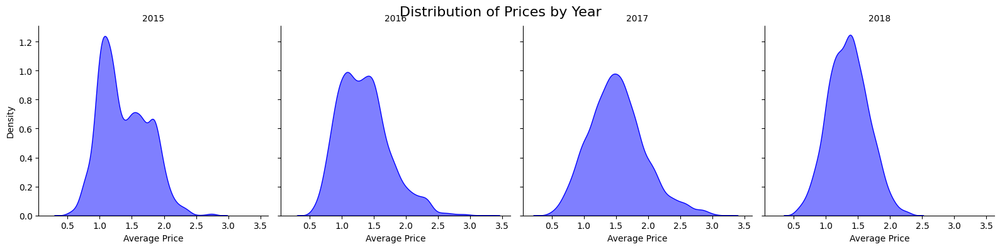

In [ ]:
import pandas as pd
import seaborn as sns
import calendar
import matplotlib.pyplot as plt

# Assuming original_df is your DataFrame containing the data

# Create a copy of the original DataFrame
seasonal_data = original_data.copy()

# Extract month_year, month, and year from the 'Date' column
seasonal_data['month_year'] = pd.to_datetime(original_data['Date']).dt.to_period('M')
seasonal_data['month'] = pd.to_datetime(original_data['Date']).dt.month
seasonal_data['year'] = pd.to_datetime(original_data['Date']).dt.year

# Map month numbers to month abbreviations
seasonal_data['monthabb'] = seasonal_data['month'].apply(lambda x: calendar.month_abbr[x])

# Let's see if there are seasonal patterns with conventional avocadoes
g = sns.FacetGrid(seasonal_data, col='year', col_wrap=4, height=4)
g.map(sns.kdeplot, 'AveragePrice', fill=True, alpha=0.5, color='blue')
g.set_titles(template="{col_name}")
g.set_axis_labels('Average Price', 'Density')
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Distribution of Prices by Year', fontsize=16)
plt.show()

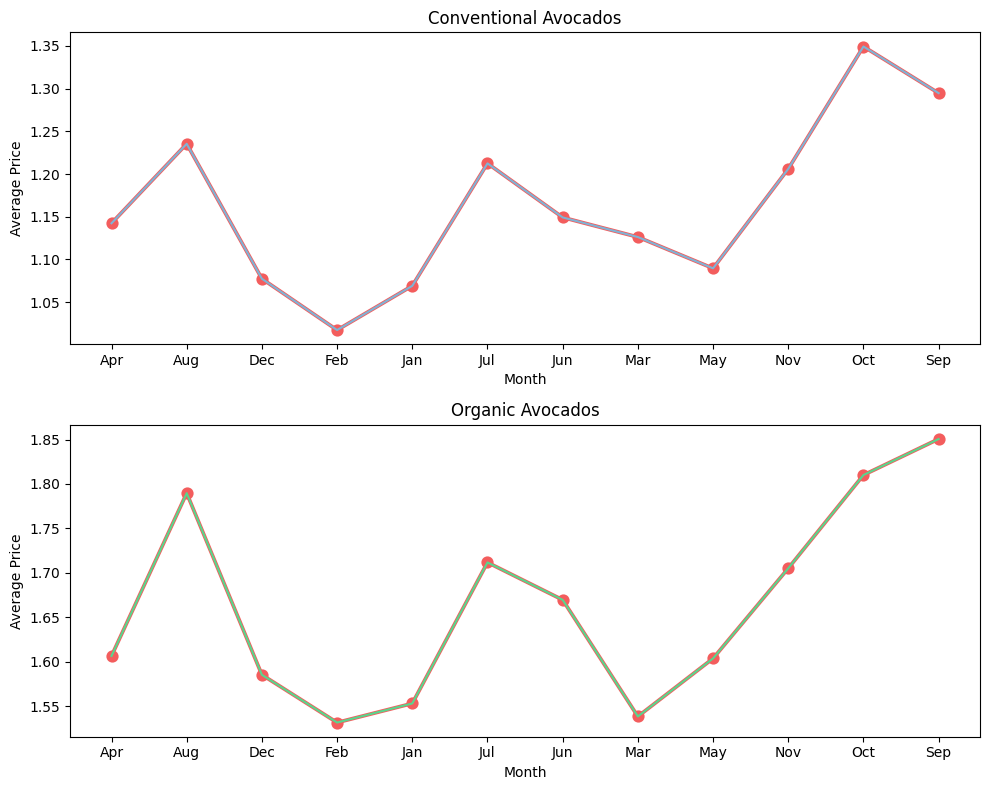

In [ ]:
conv_data = seasonal_data[seasonal_data['type'] == 'conventional']

# Calculate average price by month for conventional avocados
conv_avg_price = conv_data.groupby('monthabb')['AveragePrice'].mean().reset_index()

# Filter data for organic avocados
org_data = seasonal_data[seasonal_data['type'] == 'organic']

# Calculate average price by month for organic avocados
org_avg_price = org_data.groupby('monthabb')['AveragePrice'].mean().reset_index()

# Plotting
fig, axes = plt.subplots(nrows=2, figsize=(10, 8))

# Plot for conventional avocados
sns.pointplot(data=conv_avg_price, x='monthabb', y='AveragePrice', color='#F35D5D', ax=axes[0])
sns.lineplot(data=conv_avg_price, x='monthabb', y='AveragePrice', color='#7FB3D5', ax=axes[0])
axes[0].set_title('Conventional Avocados')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Average Price')

# Plot for organic avocados
sns.pointplot(data=org_avg_price, x='monthabb', y='AveragePrice', color='#F35D5D', ax=axes[1])
sns.lineplot(data=org_avg_price, x='monthabb', y='AveragePrice', color='#58D68D', ax=axes[1])
axes[1].set_title('Organic Avocados')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Average Price')

plt.tight_layout()
plt.show()


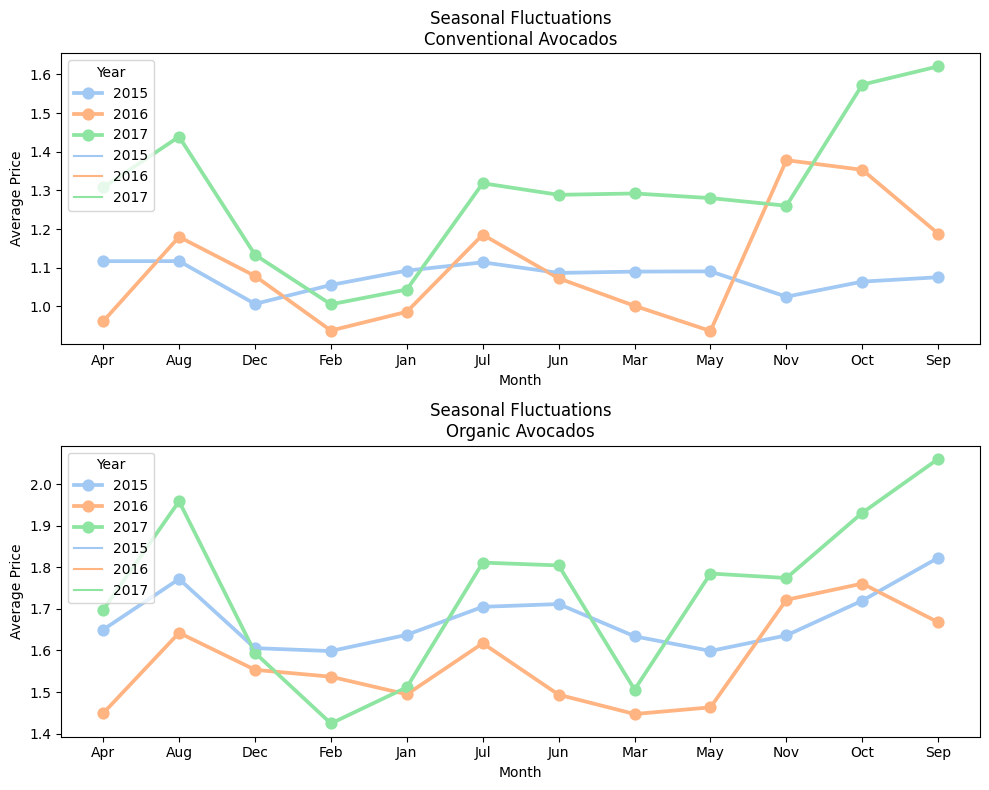

In [ ]:
conv_data_yearly = seasonal_data[(seasonal_data['type'] == 'conventional') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Calculate average price by year and month for conventional avocados
conv_avg_price_yearly = conv_data_yearly.groupby(['year', 'monthabb'])['AveragePrice'].mean().reset_index()

# Filter data for organic avocados for the specified years
org_data_yearly = seasonal_data[(seasonal_data['type'] == 'organic') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Calculate average price by year and month for organic avocados
org_avg_price_yearly = org_data_yearly.groupby(['year', 'monthabb'])['AveragePrice'].mean().reset_index()

# Plotting
fig, axes = plt.subplots(nrows=2, figsize=(10, 8))

# Plot for conventional avocados
sns.pointplot(data=conv_avg_price_yearly, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[0])
sns.lineplot(data=conv_avg_price_yearly, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[0])
axes[0].set_title('Seasonal Fluctuations\nConventional Avocados')
axes[0].set_xlabel('Month')
axes[0].set_ylabel('Average Price')
axes[0].legend(title='Year')

# Plot for organic avocados
sns.pointplot(data=org_avg_price_yearly, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[1])
sns.lineplot(data=org_avg_price_yearly, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[1])
axes[1].set_title('Seasonal Fluctuations\nOrganic Avocados')
axes[1].set_xlabel('Month')
axes[1].set_ylabel('Average Price')
axes[1].legend(title='Year')

plt.tight_layout()
plt.show()


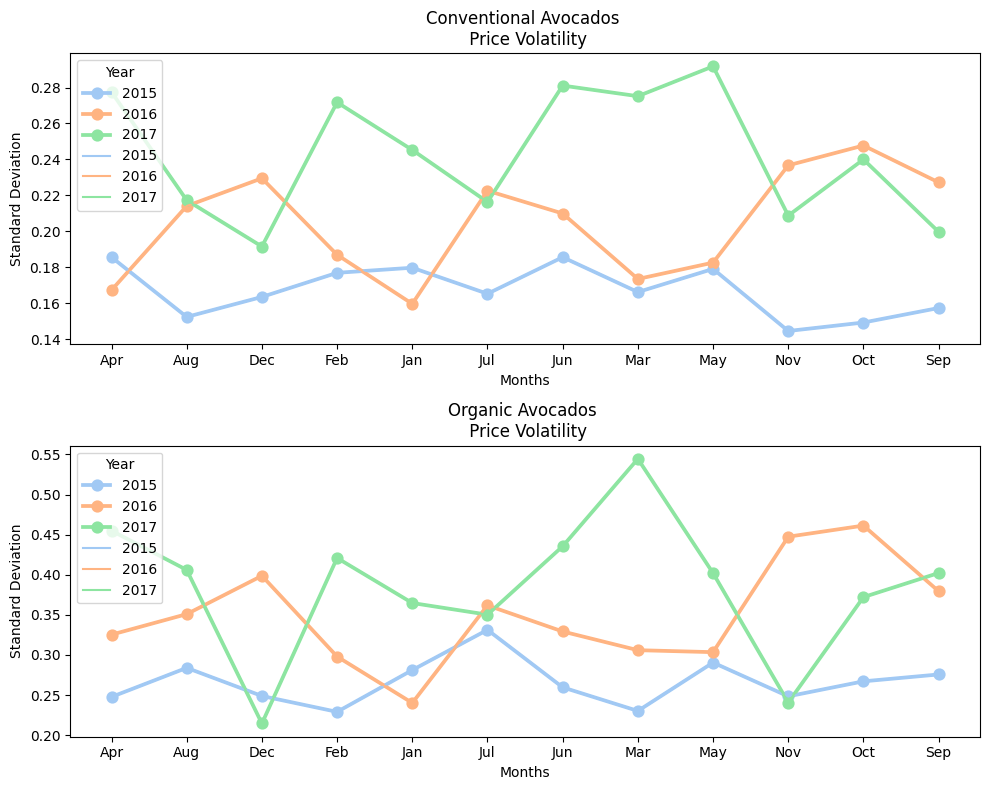

In [ ]:
conv_data_std = seasonal_data[(seasonal_data['type'] == 'conventional') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Calculate standard deviation by year and month for conventional avocados
conv_std = conv_data_std.groupby(['year', 'monthabb'])['AveragePrice'].std().reset_index()

# Filter data for organic avocados for the specified years
org_data_std = seasonal_data[(seasonal_data['type'] == 'organic') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Calculate standard deviation by year and month for organic avocados
org_std = org_data_std.groupby(['year', 'monthabb'])['AveragePrice'].std().reset_index()

fig, axes = plt.subplots(nrows=2, figsize=(10, 8))

# Plot for conventional avocados
sns.pointplot(data=conv_std, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[0])
sns.lineplot(data=conv_std, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[0])
axes[0].set_title('Conventional Avocados \n Price Volatility')
axes[0].set_xlabel('Months')
axes[0].set_ylabel('Standard Deviation')
axes[0].legend(title='Year')

# Plot for organic avocados
sns.pointplot(data=org_std, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[1])
sns.lineplot(data=org_std, x='monthabb', y='AveragePrice', hue='year', palette='pastel', ax=axes[1])
axes[1].set_title('Organic Avocados \n Price Volatility')
axes[1].set_xlabel('Months')
axes[1].set_ylabel('Standard Deviation')
axes[1].legend(title='Year')

plt.tight_layout()
plt.show()


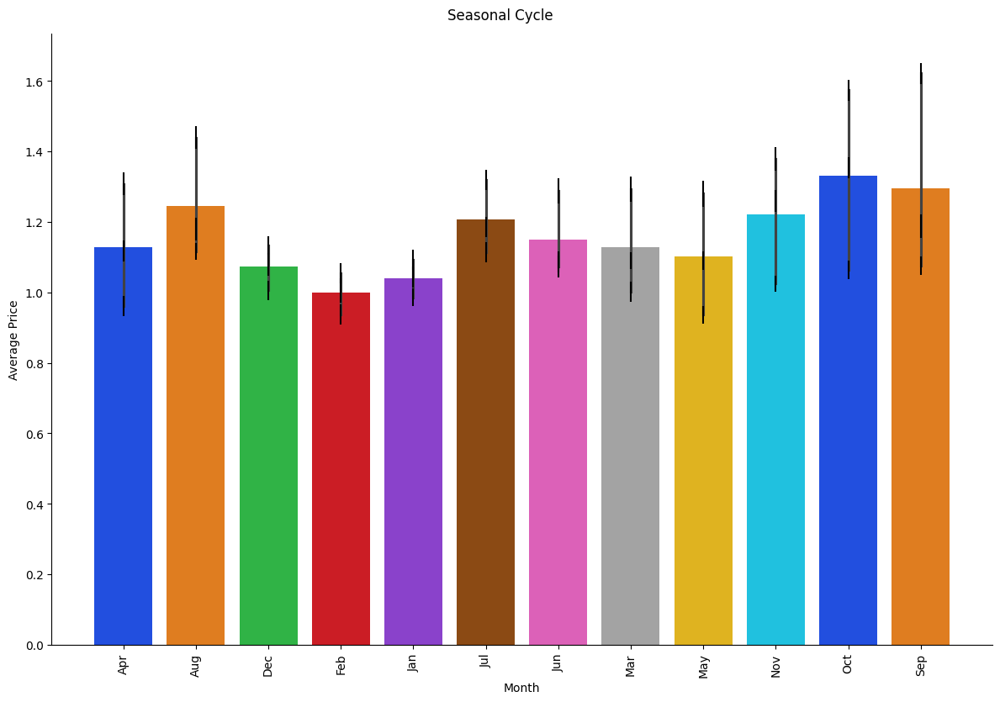

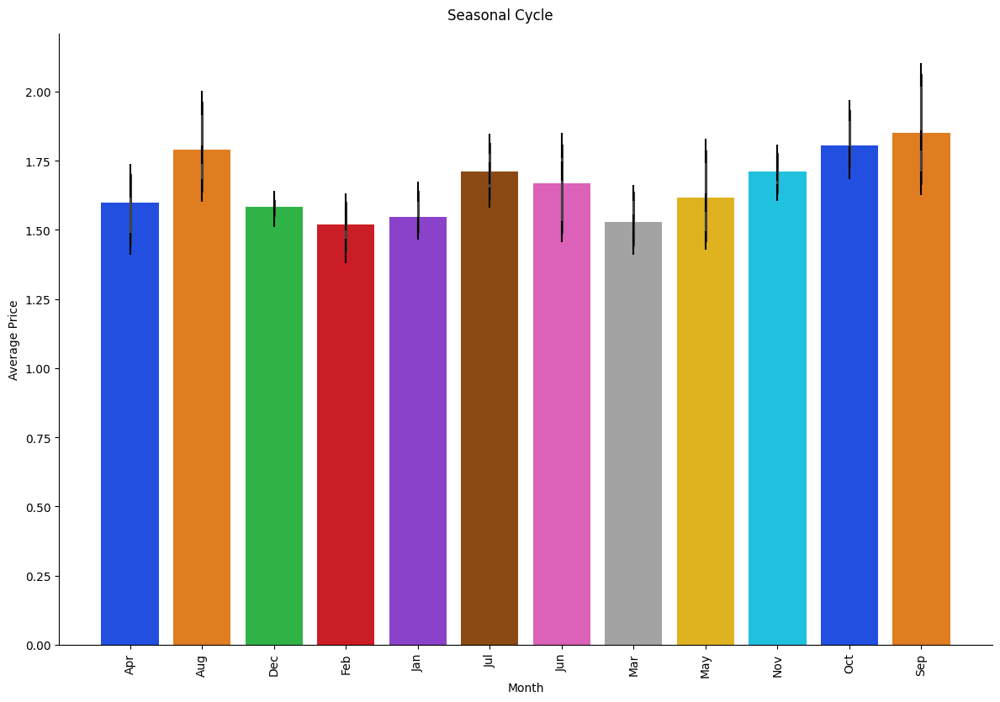

In [ ]:
def se(x):
    return (x.std() / len(x))**0.5

# Filter data for conventional avocados for the specified years
conv_data = seasonal_data[(seasonal_data['type'] == 'conventional') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Group by year and monthabb, calculate average price and standard error
conv_grouped = conv_data.groupby(['year', 'monthabb'])['AveragePrice'].agg(['mean', se]).reset_index()

# Plotting for conventional avocados
g_conv = sns.catplot(
    data=conv_grouped,
    x='monthabb',
    y='mean',
    hue='monthabb',
    kind='bar',
    palette='bright',
    height=8,
    aspect=1.5,
)

# Adding error bars
for index, row in conv_grouped.iterrows():
    plt.errorbar(x=row['monthabb'], y=row['mean'], yerr=row['se'], fmt='none', color='black')

g_conv.set_axis_labels('Month', 'Average Price')
g_conv.set_titles('Conventional Avocados')
g_conv.fig.suptitle('Seasonal Cycle', y=1.02)
g_conv.set_xticklabels(rotation=90)

# Filter data for organic avocados for the specified years
org_data = seasonal_data[(seasonal_data['type'] == 'organic') & (seasonal_data['year'].isin([2015, 2016, 2017]))]

# Group by year and monthabb, calculate average price and standard error
org_grouped = org_data.groupby(['year', 'monthabb'])['AveragePrice'].agg(['mean', se]).reset_index()

# Plotting for organic avocados
g_org = sns.catplot(
    data=org_grouped,
    x='monthabb',
    y='mean',
    hue='monthabb',
    kind='bar',
    palette='bright',
    height=8,
    aspect=1.5,
)

# Adding error bars
for index, row in org_grouped.iterrows():
    plt.errorbar(x=row['monthabb'], y=row['mean'], yerr=row['se'], fmt='none', color='black')

g_org.set_axis_labels('Month', 'Average Price')
g_org.set_titles('Organic Avocados')
g_org.fig.suptitle('Seasonal Cycle', y=1.02)
g_org.set_xticklabels(rotation=90)

plt.show()


* **Distributions per year:** It looks like most of the prices in 2015 were $1.00 for conventional avocados. For 2016 and 2017, the prices' density was slightly higher.
* **Price peaks per Month:** It looks like most price peaks occur for both conventional and organic avocados between the months of **September** and **October**.
* **Major drop in prices at the end of the year:** Interestingly enough, we see that there is a major drop in the price of avocados at the end of the year.
* **Standard deviation as a measure of volatility:** Standard deviation is just the square root of a variance. We can see that during the year 2017, the avocado market experienced the highest volatility for both conventional and organic avocados.

In [ ]:
seasonal_data.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region,month_year,month,monthabb
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany,2015-12,12,Dec
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany,2015-12,12,Dec
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany,2015-12,12,Dec
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany,2015-12,12,Dec
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany,2015-11,11,Nov


Summary:
* **Upward Trend**: The most significant upward trend happens between June - September for organic avocados and June - October for conventional avocado types. Both types of avocados have a similar trend.
* **Most expensive months to buy avocados**: Like in the previous analysis, through this visualization, we confirm that the months with the highest average price are September and October however, August is pretty expensive as well.
For each month, we have three peaks. That represents the highest peak in each month of each year. Since we are using the prices of 2015, 2016, and 2017, we can see how the prices of each year behave in all twelve months. This will help us see if there are any major seasonal patterns.

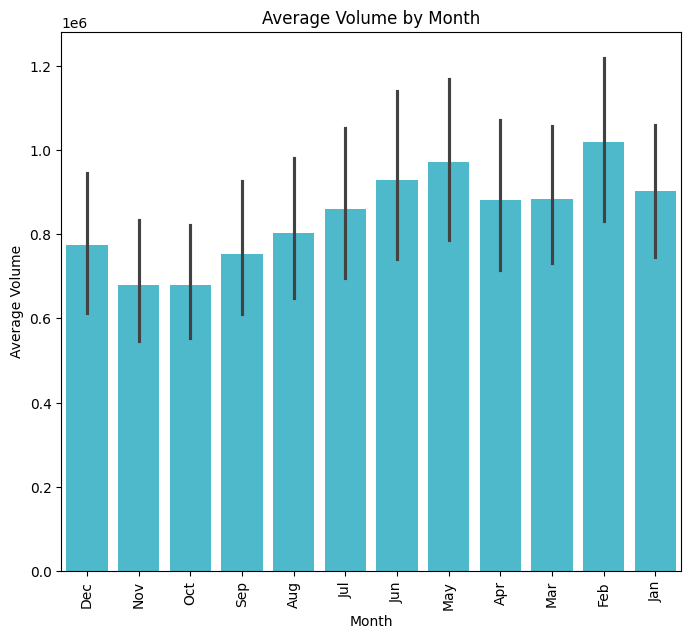

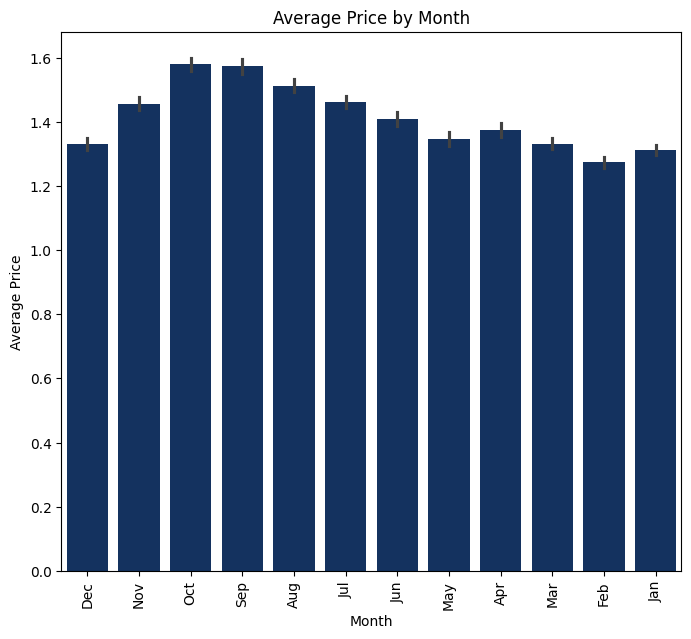

In [ ]:
# Plotting average volume by month
plt.figure(figsize=(8, 7))
sns.barplot(x='monthabb', y='Total Volume', data=seasonal_data, color=(58/255, 200/255, 225/255))
plt.title('Average Volume by Month')
plt.xlabel('Month')
plt.ylabel('Average Volume')
plt.xticks(rotation=90)
plt.show()

# Plotting average price by month
plt.figure(figsize=(8, 7))
sns.barplot(x='monthabb', y='AveragePrice', data=seasonal_data, color=(8/255, 48/255, 107/255))
plt.title('Average Price by Month')
plt.xlabel('Month')
plt.ylabel('Average Price')
plt.xticks(rotation=90)
plt.show()

# **Stationary Time Series**

**Supportive Functions for Time Series Analysis**

In [ ]:
original_data['Date'] = pd.to_datetime(original_data['Date'])
original_data.set_index('Date',inplace = True)
original_data = original_data.resample('W').sum()
original_data.head()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
Date,,,,,,,,,,,,,
2015-01-04,5507,140.54,8.467434e+07,33098258.74,36851038.43,2278818.64,12446221.39,9910008.90,2485655.90,50556.59,conventionalconventionalconventionalconvention...,217620,AlbanyAtlantaBaltimoreWashingtonBoiseBostonBuf...
2015-01-11,5399,148.03,7.855581e+07,31024164.99,32808429.84,2349167.45,12374044.96,10352936.42,1977832.00,43276.54,conventionalconventionalconventionalconvention...,217620,AlbanyAtlantaBaltimoreWashingtonBoiseBostonBuf...
2015-01-18,5291,150.24,7.838878e+07,31802706.86,31662041.93,2208250.55,12715784.74,10548854.11,2145586.13,21344.50,conventionalconventionalconventionalconvention...,217620,AlbanyAtlantaBaltimoreWashingtonBoiseBostonBuf...
2015-01-25,5183,150.89,7.646628e+07,32305132.87,28929122.37,2078378.86,13153646.97,10877316.95,2252815.92,23514.10,conventionalconventionalconventionalconvention...,217620,AlbanyAtlantaBaltimoreWashingtonBoiseBostonBuf...
2015-02-01,5075,134.68,1.194532e+08,50292988.96,50696230.48,3687489.31,14776526.50,11576833.65,3073989.39,125703.46,conventionalconventionalconventionalconvention...,217620,AlbanyAtlantaBaltimoreWashingtonBoiseBostonBuf...


In [ ]:
from itertools import combinations
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.stattools import acf, pacf
from statsmodels.tsa.arima_model import ARIMA as ARIMA
import statsmodels.api as sm
import statsmodels.tsa.api as smt

In [ ]:
def test_stationarity(timeseries):
    #Determing rolling statistics
    MA = timeseries.rolling(window = 12).mean()
    MSTD = timeseries.rolling(window = 12).std()

    #Plot rolling statistics:
    plt.figure(figsize=(15,5))
    orig = plt.plot(timeseries, color='blue',label='Original')
    mean = plt.plot(MA, color='red', label='Rolling Mean')
    std = plt.plot(MSTD, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)

    #Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)

In [ ]:
def tsplot(y, lags=None, figsize=(12, 7), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)

    with plt.style.context(style):
        fig = plt.figure(figsize=figsize)
        layout = (2, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1, 0))
        pacf_ax = plt.subplot2grid(layout, (1, 1))

        y.plot(ax=ts_ax)
        p_value = sm.tsa.stattools.adfuller(y)[1]
        ts_ax.set_title('Time Series Analysis Plots\n Dickey-Fuller: p={0:.5f}'.format(p_value))
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax)
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax)
        plt.tight_layout()

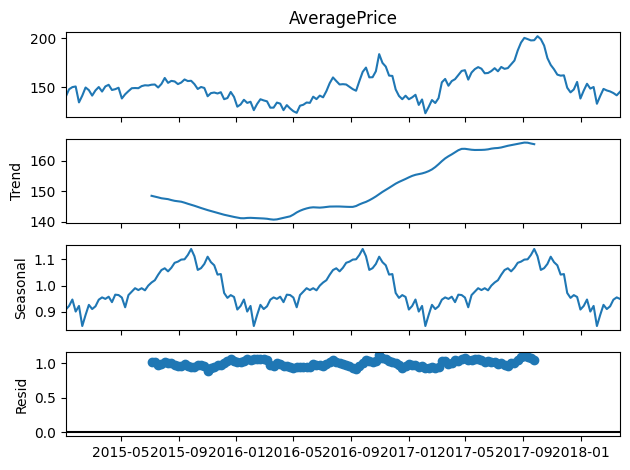

In [ ]:
dec = sm.tsa.seasonal_decompose(original_data['AveragePrice'], model = 'multiplicative').plot()
plt.show();

To test stationarity, we will use the Augmented Dickey-Fuller Test:

Null Hypothesis: It assumes that the time series is non-stationary.

Alternate Hypothesis: If the null hypothesis is rejected, the time series is stationary.

The output of the Augmented Dickey-Fuller Test includes:
* Test Statistic
* p-value
* Lags Used
* Number of Observations Used
* Critical Value (1%)
* Critical Value (5%)
* Critical Value (10%)

For the Null Hypothesis to be rejected and accepting that the time series is stationary, there are 2 requirements:
* Critical Value (5%) > Test Statistic
* p-value < 0.05

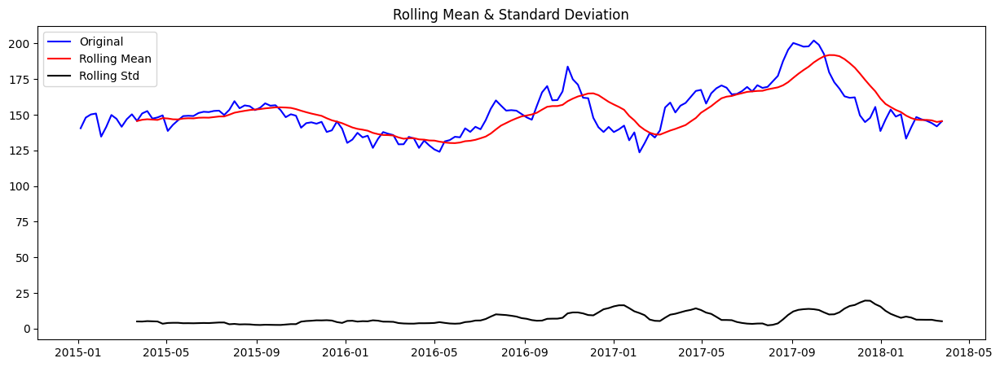

Results of Dickey-Fuller Test:
Test Statistic                  -2.363645
p-value                          0.152261
#Lags Used                       0.000000
Number of Observations Used    168.000000
Critical Value (1%)             -3.469886
Critical Value (5%)             -2.878903
Critical Value (10%)            -2.576027
dtype: float64


In [ ]:
from statsmodels.tsa.stattools import adfuller

test_stationarity(original_data['AveragePrice'])

For the **AveragePrice** time series data
* **Rolling Mean** is clearly variable with time. It is very close to the data. Thus, it can be a good descriptor of the data.
* **Rolling Standard Deviation** is pretty consistent in the initial stages. However, changes with time are observed in the later stages.
* **Test Statistic:** (-2.36) > Critical Value (5%) : (-2.88)
* **p-value** (0.15) > 0.05

Hence, the Null Hypothesis cannot be rejected, and we can conclude that the above AveragePrice time series is not stationary.

In order to eliminate trend and seasonality and make the time series stationary, we will use differencing i.e. subtracting the previous value from it's next value.

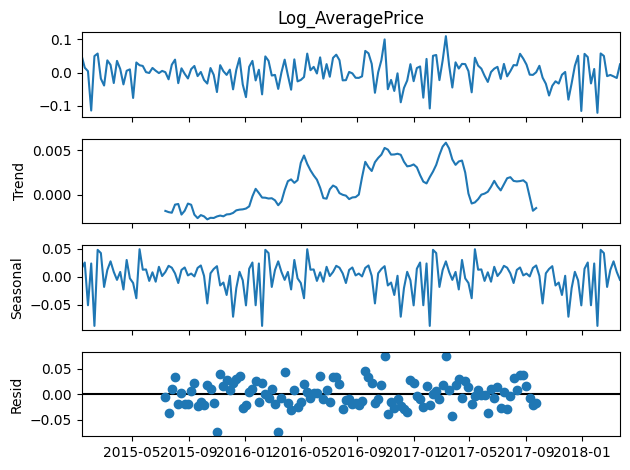

In [ ]:
original_data['Log_AveragePrice'] = np.log(original_data['AveragePrice'])
original_data_log_diff = original_data['Log_AveragePrice'].diff()
original_data_log_diff = original_data_log_diff.dropna()

dec = sm.tsa.seasonal_decompose(original_data_log_diff,period = 52).plot()
plt.show()

* We have taken the **log** of the data to deal with **stationarity** and **differencing** is done to handle trend and seasonality.
* **Trends** and **seasonality** have nearly died down, and their values have decreased as well.
* We now check the stationarity of the time series.

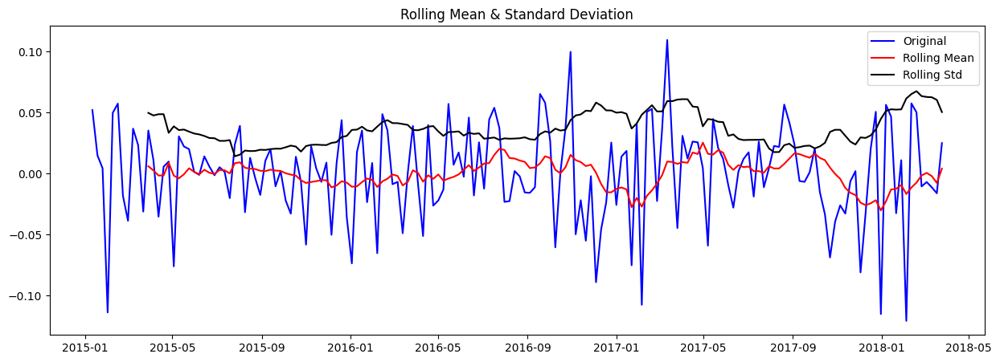

Results of Dickey-Fuller Test:
Test Statistic                -1.381774e+01
p-value                        8.010524e-26
#Lags Used                     0.000000e+00
Number of Observations Used    1.670000e+02
Critical Value (1%)           -3.470126e+00
Critical Value (5%)           -2.879008e+00
Critical Value (10%)          -2.576083e+00
dtype: float64


In [ ]:
test_stationarity(original_data_log_diff)

From the outputs of the **Augmented Dickey-Fuller Test**,
* **Rolling Mean** is very close to 0 but very small variations are present in it.
* **Rolling Standard Deviation** is very close to 0.05 with some crests and troughs present throughout.
* **Critical Value (5%)** : (-2.88) > Test Statistic : (-13.82). We can say that the time series is stationary with 99% confidence as the Test Statistic is less than the Critical Value (1%).
* 0.05 > p-value (0.00)

From these outputs, we can **reject the Null Hypothesis** and accept the Alternate Hypothesis i.e. we can say that the above time series is stationary.

# **Auto Regressive Integrated Moving Average**

Selection criteria for the order of ARIMA model :

* p: Lag value where the Partial Autocorrelation (PACF) graph cuts off or drops to 0 for the 1st instance.
* d: Number of times differencing is carried out to make the time series stationary.
* q: Lag value where the Autocorrelation (ACF) graph crosses the upper confidence interval for the 1st instance.

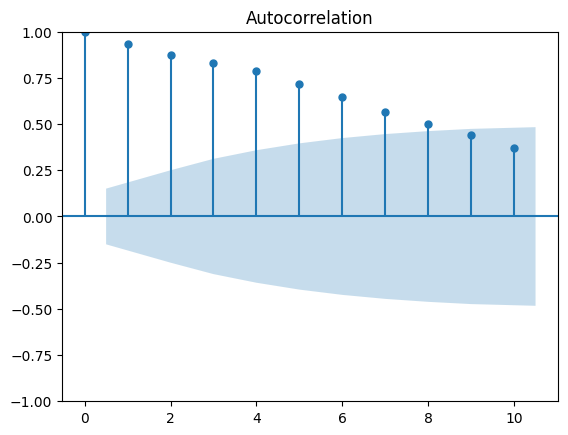

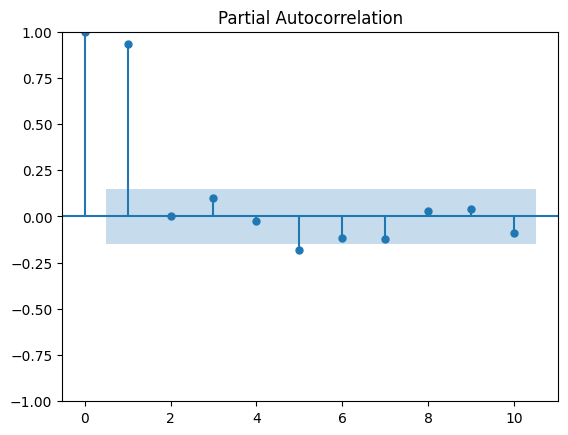

In [ ]:
import statsmodels.api as sm
def tsplot(y, lags=10, figsize=(12, 7), style='bmh'):
    sm.graphics.tsa.plot_acf(y, lags=lags)
    sm.graphics.tsa.plot_pacf(y, lags=lags)
    plt.show()

tsplot(original_data['AveragePrice'],lags = 10)

* **ACF** graph provides the correlation between the time series & its lags. For the above time series, we can observe a positive lowering correlation.
* **PACF** graph provides the correlation between the time series and individual lags. These correlation coefficients are unlike the mutual correlations that are calculated in the presence of other features.
* From the PACF graph above, the 1st lag is out of the confidence interval and probably the most significant lag. It probably dictates the pattern for the ACF graph where the next lag follows its previous lag.

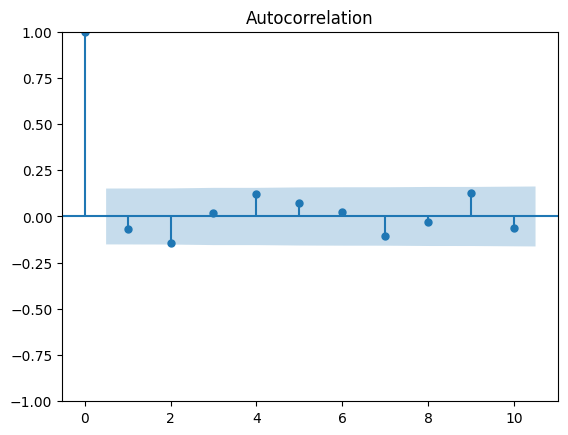

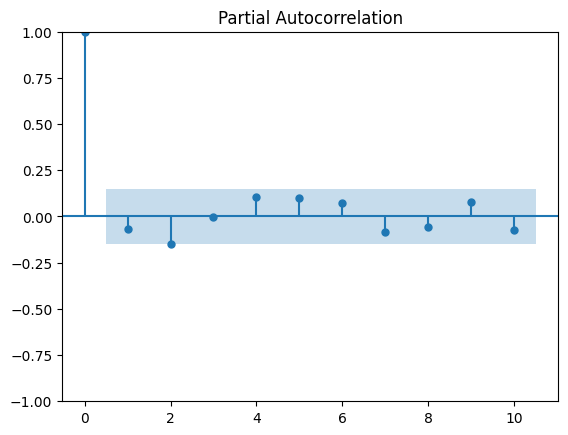

In [ ]:
tsplot(original_data_log_diff,lags = 10)

From the above plots, the following order of the ARIMA model is selected from the selection criteria mentioned above:
* p: 1
* d: 1
* q: 2

The data passed for model fitting is the **Log_AveragePrice** data which is non-differenced and non-stationary.

To make the series stationary, we differentiate the time series. Thus, this differencing of data is carried out by the ARIMA model with the help of the d parameter that provides info about the order of differencing.

Thus, the parameters **p** and **q** are selected in such a way that we pass their values, assuming the ARIMA model carries out the differencing process and makes the time series stationary.

In [ ]:
from statsmodels.tsa.arima.model import ARIMA

# Define and fit the ARIMA model with the corrected import
model = ARIMA(original_data['Log_AveragePrice'], order=(1, 1, 2))
model_fit = model.fit()

print(model_fit.summary())

                               SARIMAX Results                                
Dep. Variable:       Log_AveragePrice   No. Observations:                  169
Model:                 ARIMA(1, 1, 2)   Log Likelihood                 308.987
Date:                Fri, 19 Apr 2024   AIC                           -609.975
Time:                        08:13:35   BIC                           -597.479
Sample:                    01-04-2015   HQIC                          -604.904
                         - 03-25-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.1492      0.785     -0.190      0.849      -1.689       1.390
ma.L1          0.0735      0.776      0.095      0.925      -1.448       1.595
ma.L2         -0.1239      0.099     -1.252      0.2

* Model fitting is a measure of how well a machine learning model generalizes to similar data to that on which it was trained.
* After fitting the ARIMA model, we check this fit and compare this series with the original values of AveragePrice.
* In this process, we store the model-fitted values in a series. This series then undergoes the process of cummulative summation i.e. the opposite of differencing.
* The result of cumulative summation is the expected log values fitted by the model. These log values are then exponentiated which creates the fitted original series.

**In - Sample Forecasting**

In [ ]:
size = int(len(original_data) - 30)
train, test = original_data['Log_AveragePrice'][0:size], original_data['Log_AveragePrice'][size:len(original_data)]

print('\t ARIMA MODEL : In - Sample Forecasting \n')

history = [x for x in train]
predictions = []

for t in range(len(test)):

    model = ARIMA(history, order=(1, 1, 2))
    model_fit = model.fit()

    output = model_fit.forecast()
    yhat = output[0]
    predictions.append(float(yhat))

    obs = test[t]
    history.append(obs)
    print('predicted = %f, expected = %f' % (np.exp(yhat), np.exp(obs)))


	 ARIMA MODEL : In - Sample Forecasting 

predicted = 193.441394, expected = 200.360000
predicted = 198.861659, expected = 199.140000
predicted = 198.355802, expected = 197.790000
predicted = 197.806778, expected = 198.000000
predicted = 198.054481, expected = 202.100000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 201.822165, expected = 199.080000
predicted = 198.778823, expected = 192.550000
predicted = 193.253533, expected = 179.770000
predicted = 181.076039, expected = 172.820000
predicted = 174.468844, expected = 168.380000
predicted = 169.257551, expected = 162.950000
predicted = 163.574187, expected = 161.910000
predicted = 162.489580, expected = 162.230000
predicted = 162.371562, expected = 149.620000
predicted = 149.803467, expected = 144.880000
predicted = 145.945385, expected = 147.850000
predicted = 148.235664, expected = 155.510000
predicted = 155.320965, expected = 138.620000
predicted = 138.370209, expected = 146.640000
predicted = 147.703705, expected = 153.640000
predicted = 152.316555, expected = 148.730000
predicted = 148.450588, expected = 150.360000
predicted = 150.693718, expected = 133.280000
predicted = 134.012983, expected = 141.160000
predicted = 142.229262, expected = 148.400000
predicted = 146.818098, expected = 146.840000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 146.361398, expected = 145.820000
predicted = 145.930717, expected = 144.190000
predicted = 144.368242, expected = 141.880000
predicted = 142.246664, expected = 145.460000


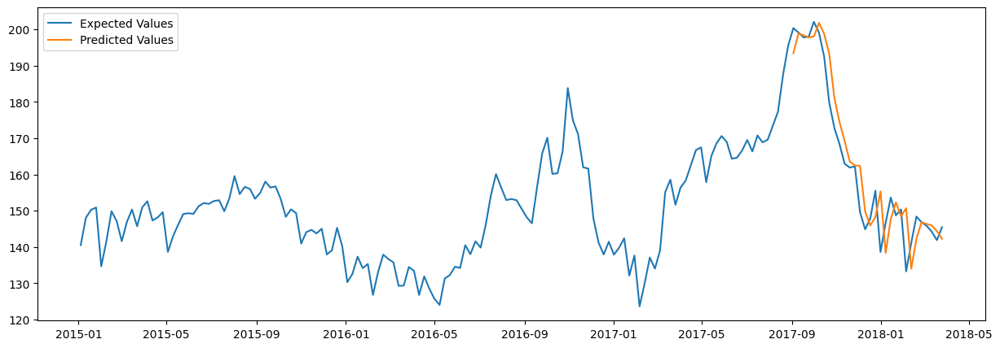

In [ ]:
predictions_series = pd.Series(predictions, index = test.index)
fig,ax = plt.subplots(nrows = 1,ncols = 1,figsize = (15,5))

plt.subplot(1,1,1)
plt.plot(original_data['AveragePrice'],label = 'Expected Values')
plt.plot(np.exp(predictions_series),label = 'Predicted Values');
plt.legend(loc="upper left")
plt.show()

**Predicted Values** and **Expected Values** are very close by and kind of display an overfit model

In [ ]:
error = np.sqrt(mean_squared_error(np.exp(test),np.exp(predictions)))
print('Test RMSE: %.4f' % error)
predictions_series = pd.Series(np.exp(predictions), index = test.index)

Test RMSE: 7.0601


The use of weekly data and the presence of seasonality can also have an effect on the model performance. We will move on to Out - Of - Sample Forecasting.

**Out - of - Sample Forecasting**

In [ ]:
from pandas.tseries.offsets import DateOffset
future_dates = [original_data.index[-1] + DateOffset(weeks = x) for x in range(0,52)]

# New dataframe for storing the future values
original_data_2 = pd.DataFrame(index = future_dates[1:],columns = original_data.columns)

forecast = pd.concat([original_data,original_data_2])
forecast['ARIMA_Forecast_Function'] = np.NaN
forecast['ARIMA_Predict_Function'] = np.NaN

In [ ]:
def arima_out_of_sample_forecast(model, steps, dataframe, forecast_column, predict_column):

    forecast_results = model.forecast(steps=steps)
    forecast_values = np.exp(forecast_results[0])

    dataframe[forecast_column] = np.nan
    dataframe[predict_column] = np.nan

    dataframe[forecast_column][-steps:] = forecast_values
    dataframe[predict_column][-steps:] = forecast_results[0]

arima_out_of_sample_forecast(model_fit, 52, forecast, 'ARIMA_Forecast_Function', 'ARIMA_Predict_Function')

<ipython-input-156-ddfaf152f78d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-156-ddfaf152f78d>:10: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



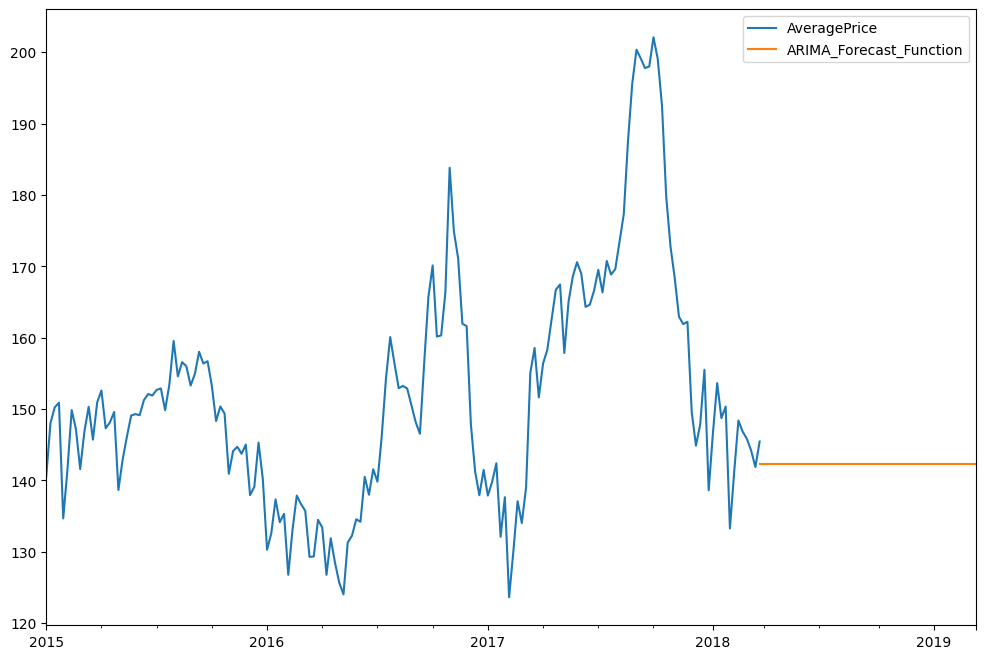

In [ ]:
forecast[['AveragePrice','ARIMA_Forecast_Function']].plot(figsize = (12,8));

Predict Function

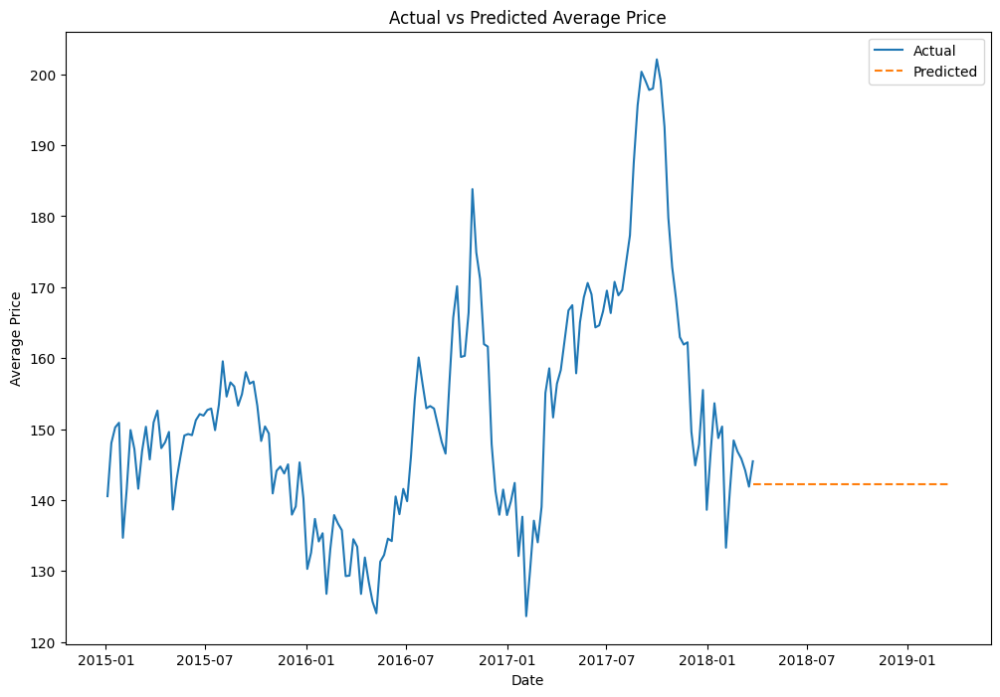

In [ ]:
def plot_actual_vs_predicted(dataframe, actual_column, predicted_column, figsize=(12, 8)):

    import matplotlib.pyplot as plt

    plt.figure(figsize=figsize)
    plt.plot(dataframe[actual_column], label='Actual')
    plt.plot(dataframe[predicted_column], label='Predicted', linestyle='dashed')
    plt.xlabel('Date')
    plt.ylabel('Average Price')
    plt.title('Actual vs Predicted Average Price')
    plt.legend()
    plt.show()

# Usage
plot_actual_vs_predicted(forecast, 'AveragePrice', 'ARIMA_Forecast_Function')


In [ ]:
# Comparing the values for equality
comparison = (forecast['ARIMA_Forecast_Function'] == forecast['ARIMA_Predict_Function']).all()

print(comparison)

False


For the above trained ARIMA model, values generated by forecast_function and predict function are identical or differ by a few decimal points

The model clearly **did not capture the seasonal patterns** of the data.

**Seasonal Auto Regressive Integrated Moving Average (SARIMA)**

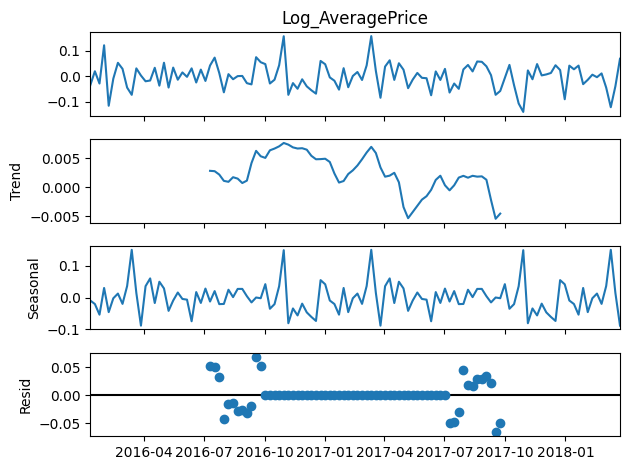

In [ ]:
original_data_log_diff_seas = original_data_log_diff.diff(52)
original_data_log_diff_seas = original_data_log_diff_seas.dropna()
dec = sm.tsa.seasonal_decompose(original_data_log_diff_seas).plot()
plt.show()

* This data is in a **weekly format**, and the **seasonal period is 1 year**.
* Hence, we differentiate the already differenced data by a periodicity, M, with a value of 52.
* We can observe that the seasonality of the data is nearly gone, with y-axis values ranging from -0.1 to 0.1.
* We will check this seasonal differenced data for stationarity.

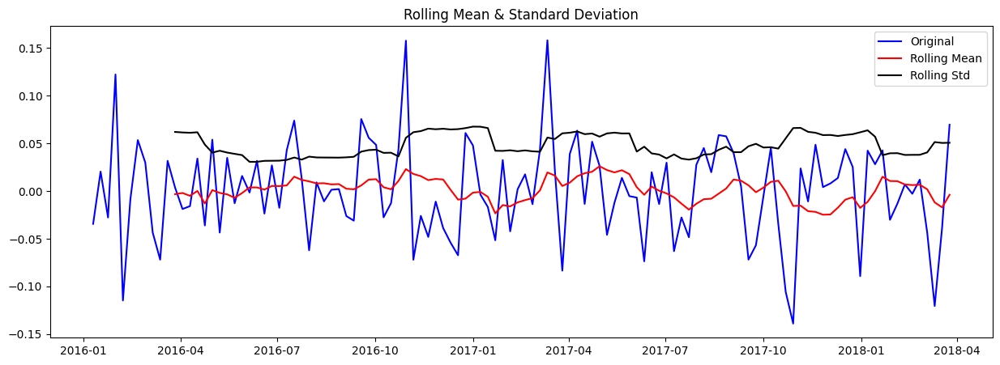

Results of Dickey-Fuller Test:
Test Statistic                  -4.596151
p-value                          0.000131
#Lags Used                      11.000000
Number of Observations Used    104.000000
Critical Value (1%)             -3.494850
Critical Value (5%)             -2.889758
Critical Value (10%)            -2.581822
dtype: float64


In [ ]:
test_stationarity(original_data_log_diff_seas)

From the outputs of the Augmented Dickey-Fuller Test,
* **Rolling Mean** is very close to 0, but minimal variations are present in it.
* **Rolling Standard Deviation** is very close to 0.05, with some crests and troughs present throughout.
* **Critical Value** (5%) : (-2.89) > Test Statistic : (-4.60). We can say that the time series is stationary with 99% confidence as the Test Statistic is less than the Critical Value (1%) as well.
* **0.05 > p-value** (0.00)

From these outputs, we can **reject the Null Hypothesis** and accept the Alternate Hypothesis i.e. we can say that the above **time series is stationary**.

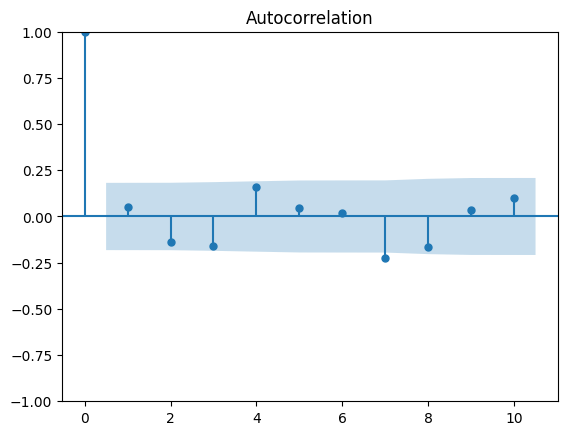

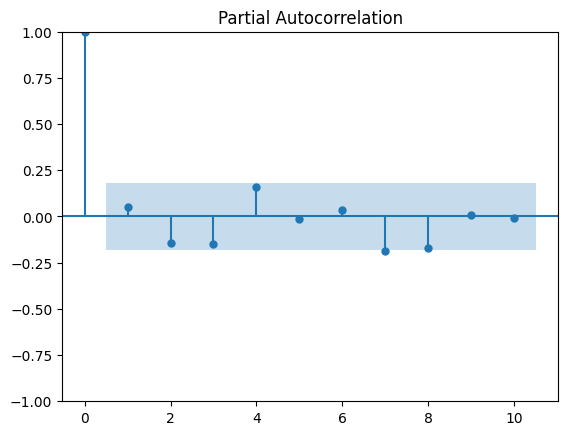

In [ ]:
tsplot(original_data_log_diff_seas)

For the SARIMA model, order of (p,d,q) will be same as the order of the ARIMA model above.

For (P, D, Q, M):
* P: 0
* D: 1
* Q: 0
* M: 52

For SARIMA, creating a grid search framework and selecting the parameters with the lowest AIC & BIC values is also a popular choice.

In [ ]:
model = sm.tsa.statespace.SARIMAX(original_data['Log_AveragePrice'],order = (1,1,2),seasonal_order = (0,1,0,52))
model_fit = model.fit()
print(model_fit.summary())

                                      SARIMAX Results                                      
Dep. Variable:                    Log_AveragePrice   No. Observations:                  169
Model:             SARIMAX(1, 1, 2)x(0, 1, [], 52)   Log Likelihood                 184.924
Date:                             Fri, 19 Apr 2024   AIC                           -361.848
Time:                                     08:13:57   BIC                           -350.834
Sample:                                 01-04-2015   HQIC                          -357.377
                                      - 03-25-2018                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.7792      0.166      4.696      0.000       0.454       1.104
ma.L1         -0.7519      

**In - Sample Forecasting**

In [ ]:
size = int(len(original_data) - 30)
train, test = original_data['Log_AveragePrice'][0:size], original_data['Log_AveragePrice'][size:len(original_data)]

print('\t SARIMA MODEL : In - Sample Forecasting \n')

history = [x for x in train]
predictions = []

for t in range(len(test)):

    model = sm.tsa.statespace.SARIMAX(history,order = (1,1,2),seasonal_order = (0,1,0,52))
    model_fit = model.fit(disp = 0)

    output = model_fit.forecast()

    yhat = output[0]
    predictions.append(float(yhat))

    obs = test[t]
    history.append(obs)

    print('predicted = %f, expected = %f' % (np.exp(yhat), np.exp(obs)))

	 SARIMA MODEL : In - Sample Forecasting 

predicted = 190.139066, expected = 200.360000
predicted = 196.126495, expected = 199.140000
predicted = 211.037017, expected = 197.790000
predicted = 207.504225, expected = 198.000000
predicted = 202.787502, expected = 202.100000
predicted = 190.648998, expected = 199.080000
predicted = 199.363336, expected = 192.550000
predicted = 199.445814, expected = 179.770000
predicted = 199.347657, expected = 172.820000
predicted = 165.636797, expected = 168.380000
predicted = 169.250186, expected = 162.950000
predicted = 156.631422, expected = 161.910000
predicted = 164.719655, expected = 162.230000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 150.102117, expected = 149.620000
predicted = 144.451707, expected = 144.880000
predicted = 142.802795, expected = 147.850000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 152.898609, expected = 155.510000
predicted = 151.978344, expected = 138.620000
predicted = 140.295198, expected = 146.640000
predicted = 150.886886, expected = 153.640000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 142.549652, expected = 148.730000
predicted = 155.136774, expected = 150.360000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



predicted = 134.572446, expected = 133.280000
predicted = 140.249573, expected = 141.160000
predicted = 149.049635, expected = 148.400000
predicted = 145.166073, expected = 146.840000
predicted = 152.441971, expected = 145.820000
predicted = 162.540832, expected = 144.190000
predicted = 147.750965, expected = 141.880000
predicted = 137.901462, expected = 145.460000


/usr/local/lib/python3.10/dist-packages/statsmodels/base/model.py:607: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



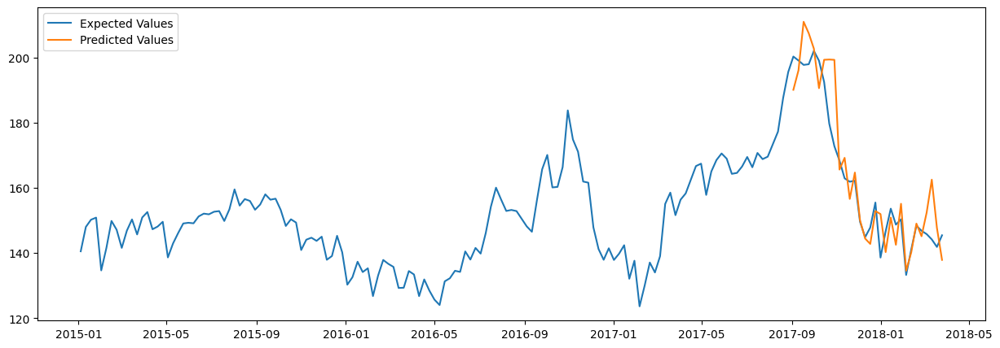

In [ ]:
predictions_series = pd.Series(predictions, index = test.index)
fig,ax = plt.subplots(nrows = 1,ncols = 1,figsize = (15,5))

plt.subplot(1,1,1)
plt.plot(original_data['AveragePrice'],label = 'Expected Values')
plt.plot(np.exp(predictions_series),label = 'Predicted Values');
plt.legend(loc="upper left")
plt.show()

Predicted Values and Expected Values are very close by and kind of display an overfit model.

In [ ]:
error = np.sqrt(mean_squared_error(np.exp(test),np.exp(predictions)))
print('Test RMSE: %.4f' % error)
predictions_series = pd.Series(np.exp(predictions), index = test.index)

Test RMSE: 9.0690


**Out of Sample Forecasting**

In [ ]:
def sarima_out_of_sample_forecast(model, steps, dataframe, forecast_column, predict_column):
    """
    Perform out-of-sample forecasting using the provided SARIMA model and store the forecasted values in the specified columns.

    Parameters:
    - model: The SARIMA model previously fitted.
    - steps: The number of steps to forecast.
    - dataframe: The dataframe where the forecasted values will be stored.
    - forecast_column: The name of the column to store the forecasted values.
    - predict_column: The name of the column to store the predicted values.

    Returns:
    - None
    """
    forecast_results = model.forecast(steps=steps)
    forecast_values = np.exp(forecast_results)

    dataframe[forecast_column] = np.nan
    dataframe[predict_column] = np.nan

    dataframe[forecast_column][-steps:] = forecast_values
    dataframe[predict_column][-steps:] = forecast_results

# Usage for the SARIMA Out-of-Sample Forecasting function
sarima_out_of_sample_forecast(model_fit, 52, forecast, 'SARIMA_Forecast_Function', 'SARIMA_Predict_Function')


<ipython-input-167-76069dd3527a>:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-167-76069dd3527a>:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



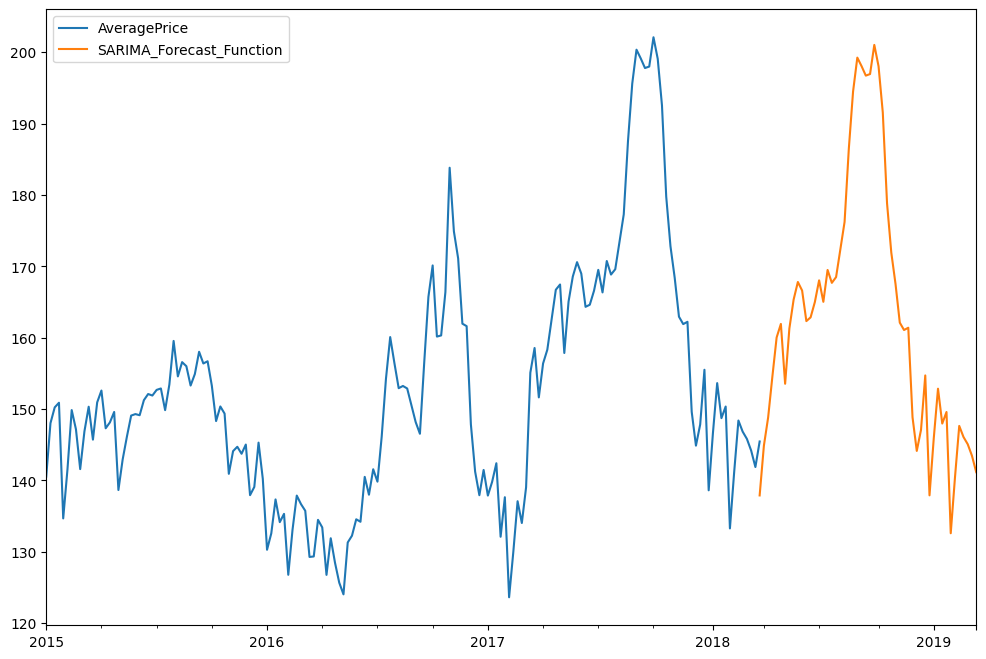

In [ ]:
forecast[['AveragePrice','SARIMA_Forecast_Function']].plot(figsize = (12,8));

From the above graph, we can say that the SARIMA model captured the seasonal patterns and created a slight uptrend in future predictions.

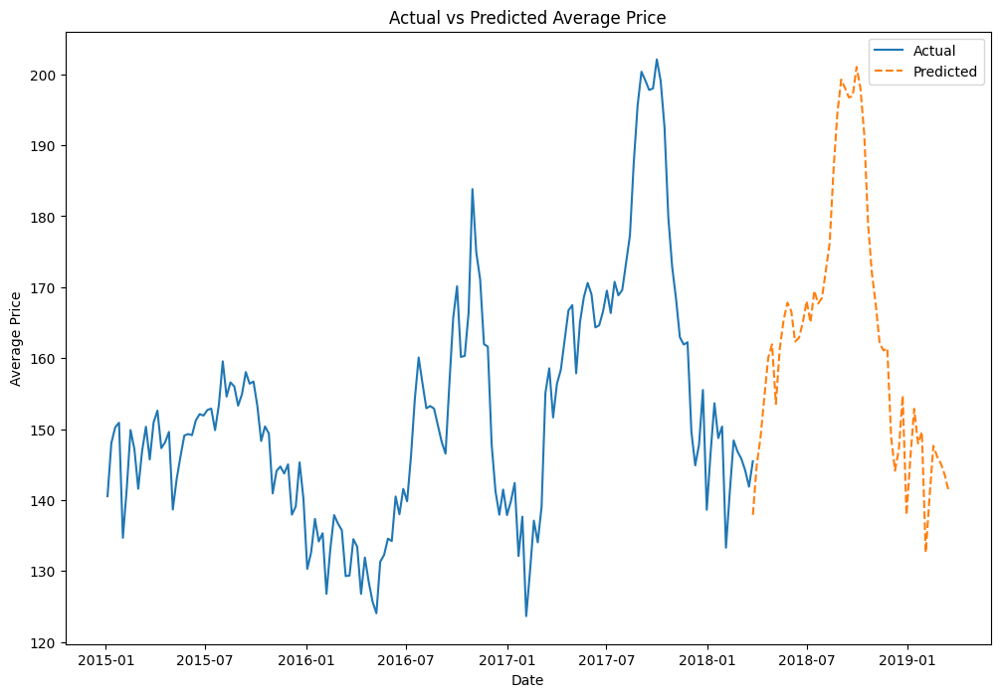

In [ ]:
#Predict Function
def plot_actual_vs_predicted(dataframe, actual_column, predicted_column, figsize=(12, 8)):
    """
    Plot the actual values alongside the predicted values from the SARIMA model.

    Parameters:
    - dataframe: The dataframe containing the actual and predicted values.
    - actual_column: The name of the column containing the actual values.
    - predicted_column: The name of the column containing the predicted values.
    - figsize: The size of the figure to be plotted.

    Returns:
    - None
    """
    import matplotlib.pyplot as plt

    plt.figure(figsize=figsize)
    plt.plot(dataframe[actual_column], label='Actual')
    plt.plot(dataframe[predicted_column], label='Predicted', linestyle='dashed')
    plt.xlabel('Date')
    plt.ylabel('Average Price')
    plt.title('Actual vs Predicted Average Price')
    plt.legend()
    plt.show()

plot_actual_vs_predicted(forecast, 'AveragePrice', 'SARIMA_Forecast_Function')

In [ ]:
# Comparing the values for equality
comparison = (forecast['SARIMA_Forecast_Function'] == forecast['SARIMA_Predict_Function']).all()

print(comparison)

False


For the above trained SARIMA model, values generated by forecast_function and predict function are identical or differ by a few decimal points

**SARIMA** was much **better** at capturing seasonal patterns of data